In [2]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!nvidia-smi

Fri Aug  7 18:00:23 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [4]:
### Utilize GPU if available
!pip install -q "torch==1.4" "torchvision==0.5.0"
import torch
!pip install -q six numpy scipy Pillow matplotlib scikit-image opencv-python imageio
!pip install -U -q git+https://github.com/albumentations-team/albumentations
!pip install ensemble-boxes

     |████████████████████████████████| 753.4MB 21kB/s 
     |████████████████████████████████| 4.0MB 49.8MB/s 
     |████████████████████████████████| 952kB 4.4MB/s 


In [5]:
import cv2
import gc
import numpy as np
import pandas as pd
import seaborn as sns
import torch
import torchvision
from pprint import pprint
from torch.utils.data import DataLoader, Dataset
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
from glob import glob
import warnings
from torchvision.models.detection.rpn import RPNHead
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor,FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.rpn import AnchorGenerator

%matplotlib inline

warnings.filterwarnings("ignore")
DIR = '/content/gdrive/My Drive/Global Wheat Detection/'
DATA_ROOT_PATH = DIR + "test"
DIR_PATH = '/content/gdrive/My Drive/Colab Notebooks/checkpoints/saved/'
MODELS_DIR_PATH = DIR_PATH + 'after/'
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
DIR_TRAIN = DIR + "train"

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [6]:
df = pd.read_csv(f'{DIR}train_pascall_voc_format.csv')
df.head()

,image_id,width,height,source,x_start,y_start,x_end,y_end,area
0,b6ab77fd7,1024,1024,usask_1,834.0,222.0,890.0,258.0,2016.0
1,b6ab77fd7,1024,1024,usask_1,226.0,548.0,356.0,606.0,7540.0
2,b6ab77fd7,1024,1024,usask_1,377.0,504.0,451.0,664.0,11840.0
3,b6ab77fd7,1024,1024,usask_1,834.0,95.0,943.0,202.0,11663.0
4,b6ab77fd7,1024,1024,usask_1,26.0,144.0,150.0,261.0,14508.0


In [7]:
df_folds = pd.read_csv(DIR + "5_fold.csv")
df_folds.head()

,image_id,bbox_count,source,stratify_group,fold
0,00333207f,55,arvalis_1,arvalis_1_3,1
1,005b0d8bb,20,usask_1,usask_1_1,3
2,006a994f7,25,inrae_1,inrae_1_1,1
3,00764ad5d,41,inrae_1,inrae_1_2,0
4,00b5fefed,25,arvalis_3,arvalis_3_1,3


In [8]:
def get_dataset_from_fold(df_folds, fold_number):
    dataset = df_folds[df_folds['fold'] == fold_number]
    images_list = dataset['image_id'].values  
    dataset = df[df['image_id'].isin(images_list)]
    return dataset

def concat_dfs(df1, df2, df3, df4):
    frames = [df1, df2, df3, df4]
    return pd.concat(frames)

def normalize(img):
    img -= img.min()
    img /= img.max()
    return img

In [9]:
# Spliting dataset into 5 folds
mini_datasets = []
for i in range(5):
    dataset = get_dataset_from_fold(df_folds, i)
    mini_datasets.append(dataset)

kfold_split =[]
for i, _ in enumerate(mini_datasets):
    val = None
    rest = []
    for j, ds in enumerate(mini_datasets):
        if j == i:# validtion
            image_ids = ds['image_id'].unique()[:40]
            mini_dataset = ds[ds.image_id.isin(image_ids)]
            val = mini_dataset
            # val = ds
        else:
            # image_ids = ds['image_id'].unique()[:100]
            # mini_dataset = ds[ds.image_id.isin(image_ids)]
            # rest.append(mini_dataset)
            rest.append(ds)
    
    kfold_split.append((pd.concat(rest), val))  


In [10]:
### Splitting Train Dataset into train - val (80:20)
validition_index = 0
train_df = kfold_split[validition_index][0]
valid_df = kfold_split[validition_index][1]
print(f'Train {len(train_df.image_id.unique())} images, total bounding box: {len(train_df)}')
print(f'Validition {len(valid_df.image_id.unique())} images, total bounding box: {len(valid_df)}')

Train 2698 images, total bounding box: 118424
Validition 40 images, total bounding box: 1159


In [11]:
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor,FasterRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.rpn import RPNHead


def load_resnet(path): 
    # backcone_model = ['resnet50', 'resnet101', 'resnet152']

    num_classes = 2 # 1 class (wheat) + background

    # create an anchor_generator for the FPN which by default has 5 outputs
    backbone_model = path.split('/')[-1].split('_')[0] # extract backbone_model from path
    anchor_generator = AnchorGenerator(
        sizes=tuple([(32, 64, 128, 256, 512) for _ in range(5)]),
        aspect_ratios=tuple([(0.25, 0.5, 1.0, 2.0) for _ in range(5)]))
    
    pretrained_backbone=False
    backbone = resnet_fpn_backbone(backbone_model, pretrained_backbone)
    fasterrcnn = FasterRCNN(backbone, num_classes,
                    rpn_anchor_generator=anchor_generator,
                    rpn_head=RPNHead(256, anchor_generator.num_anchors_per_location()[0]))
    in_features = fasterrcnn.roi_heads.box_predictor.cls_score.in_features
    fasterrcnn.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    checkpoint = torch.load(path)
    try:
        fasterrcnn.load_state_dict(checkpoint)
    except:
        fasterrcnn.load_state_dict(checkpoint['model_state_dict']) 

    fasterrcnn.to(device)
    fasterrcnn.eval()
    return fasterrcnn


# Load models For Testing

In [12]:
models = {
    'resnet50':[
        load_resnet(f'{MODELS_DIR_PATH}resnet50_fold 0.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet50_fold 1.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet50_fold 2.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet50_fold 3.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet50_fold 4.pth')
    ],
    'resnet101':[
        load_resnet(f'{MODELS_DIR_PATH}resnet101_fold 0.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet101_fold 1.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet101_fold 2.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet101_fold 3.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet101_fold4.pt')
    ],
    'resnet152':[
        load_resnet(f'{MODELS_DIR_PATH}resnet152_fold 0.pth'),
        load_resnet(f'{MODELS_DIR_PATH}resnet152_fold1.pt'),
        load_resnet(f'{MODELS_DIR_PATH}resnet152_fold2.pt'),
        load_resnet(f'{MODELS_DIR_PATH}resnet152_fold3.pt'),
        load_resnet(f'{MODELS_DIR_PATH}resnet152_fold4.pt')
    ]
}

# TTA approach for object detection tasks.

### "...However, there also exists some ways to improve the results of the model by changing the way we test it, and this is where Test Time Augmentation (TTA) comes into play…"


TTA (Test Time Augmentation) is approach with augmentation of test images.
we took the implematiton for this from [[WBF over TTA][Single Model] EfficientDet](https://www.kaggle.com/shonenkov/wbf-over-tta-single-model-efficientdet) notebook, and used his custom TTA API. big appreceate! 


### What is Test Time Augmentation ?
Similar to what Data Augmentation is doing to the training set, the purpose of Test Time Augmentation is to perform random modifications to the test images. Thus, instead of showing the regular, “clean” images, only once to the trained model, we will show it the augmented images several times. We will then average the predictions of each corresponding image and take that as our final guess.

The reason why it works is that, by averaging our predictions, on randomly modified images, we are also averaging the errors. The error can be big in a single vector, leading to a wrong answer, but when averaged, only the correct answer stand out.

Test Time Augmentation is particularly useful for test images that the model is pretty unsure.

sources:

* [Test Time Augmentation (TTA)](https://towardsdatascience.com/test-time-augmentation-tta-and-how-to-perform-it-with-keras-4ac19b67fb4d
)
 
* [ How to Use Test-Time Augmentation to Make Better Predictions](https://machinelearningmastery.com/how-to-use-test-time-augmentation-to-improve-model-performance-for-image-classification/)

In [14]:
class WheatDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()
        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms

    def __getitem__(self, index: int):

        # Retriving image id and records from df
        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]

        # Loading Image
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        
        # Converting xmin, ymin, w, h to x1, y1, x2, y2
        boxes = records[['x_start', 'y_start', 'x_end', 'y_end', 'area']].values

        area = torch.as_tensor(boxes[:, -1], dtype=torch.float32)

        # there is only one class
        labels = torch.ones((records.shape[0],), dtype=torch.int64)

        target = {}
        target['boxes'] = boxes[:, :-1]
        target['image_id'] = torch.tensor([index])
        target['labels'] = labels
                                        
        # Applying Transforms
        if self.transforms:
            sample = {
                'image': image,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
        # image = cv2.resize(image, (224, 224))    
        return image, target, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [15]:
class BaseWheatTTA:
    """ author: @shonenkov """
    image_size = 1024

    def augment(self, image):
        raise NotImplementedError
    
    def batch_augment(self, images):
        raise NotImplementedError
    
    def deaugment_boxes(self, boxes):
        raise NotImplementedError

class TTAHorizontalFlip(BaseWheatTTA):
    """ author: @shonenkov """

    def augment(self, image):
        return image.flip(1)
    
    def batch_augment(self, images):
        return images.flip(2)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [1,3]] = self.image_size - boxes[:, [3,1]]
        return boxes

class TTAVerticalFlip(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return image.flip(2)
    
    def batch_augment(self, images):
        return images.flip(3)
    
    def deaugment_boxes(self, boxes):
        boxes[:, [0,2]] = self.image_size - boxes[:, [2,0]]
        return boxes
    
class TTARotate90(BaseWheatTTA):
    """ author: @shonenkov """
    
    def augment(self, image):
        return torch.rot90(image, 1, (1, 2))

    def batch_augment(self, images):
        return torch.rot90(images, 1, (2, 3))
    
    def deaugment_boxes(self, boxes):
        res_boxes = boxes.copy()
        res_boxes[:, [0,2]] = self.image_size - boxes[:, [1,3]]
        res_boxes[:, [1,3]] = boxes[:, [2,0]]
        return res_boxes

class TTACompose(BaseWheatTTA):
    """ author: @shonenkov """
    def __init__(self, transforms):
        self.transforms = transforms
        
    def augment(self, image):
        for transform in self.transforms:
            image = transform.augment(image)
        return image
    
    def batch_augment(self, images):
        for transform in self.transforms:
            images = transform.batch_augment(images)
        return images
    
    def prepare_boxes(self, boxes):
        result_boxes = boxes.copy()
        result_boxes[:,0] = np.min(boxes[:, [0,2]], axis=1)
        result_boxes[:,2] = np.max(boxes[:, [0,2]], axis=1)
        result_boxes[:,1] = np.min(boxes[:, [1,3]], axis=1)
        result_boxes[:,3] = np.max(boxes[:, [1,3]], axis=1)
        return result_boxes
    
    def deaugment_boxes(self, boxes):
        for transform in self.transforms[::-1]:
            boxes = transform.deaugment_boxes(boxes)
        return self.prepare_boxes(boxes)
    
    
def process_det(index, det, score_threshold=0.25):
    boxes = det[index]['boxes'].detach().cpu().numpy()[:,:4]    
    scores = det[index]['scores'].detach().cpu().numpy()
    # boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
    # boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
    boxes = (boxes).clip(min=0, max=1024).astype(int)
    indexes = np.where(scores>score_threshold)
    boxes = boxes[indexes]
    scores = scores[indexes]
    return boxes, scores  

In [16]:
from ensemble_boxes import *

from itertools import product

tta_transforms = []
for tta_combination in product([TTAHorizontalFlip(), None], 
                               [TTAVerticalFlip(), None],
                               [TTARotate90(), None]):
    tta_transforms.append(TTACompose([tta_transform for tta_transform in tta_combination if tta_transform]))

def make_tta_predictions(net, images, score_threshold=0.4):
    with torch.no_grad():
        images = torch.stack(images).float().cuda()
        predictions = []
        for tta_transform in tta_transforms:
            result = []
            det = net(tta_transform.batch_augment(images.clone()))

            for i in range(images.shape[0]):
                boxes = det[i]['boxes'].detach().cpu().numpy()
                scores = det[i]['scores'].detach().cpu().numpy()
                indexes = np.where(scores > score_threshold)[0]
                boxes = boxes[indexes]
                boxes = tta_transform.deaugment_boxes(boxes.copy())
                result.append({
                    'boxes': boxes,
                    'scores': scores[indexes],
                })
            predictions.append(result)
    return predictions

def make_ensemble_predictions(images, models):
    images = list(image.to(device) for image in images)    
    result = []
    for net in models:
        predictions = make_tta_predictions(net, images)
        for i in range(len(images)):
            boxes, scores, labels = run_wbf(predictions, image_index=i, iou_thr=0.42, skip_box_thr=0.35,conf_type='max')
            outputs = {'boxes': boxes,
                       'labels': labels,
                       'scores': scores}
            result.append([outputs])
    return result

In [17]:
from albumentations import Compose 
from albumentations.pytorch.transforms import ToTensorV2

def collate_fn(batch):
    return tuple(zip(*batch))

def get_valid_transform():
    return Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def init_valid_dataloader():
    valid_dataset = WheatDataset(valid_df, DIR_TRAIN, 
                                transforms = get_valid_transform())

    valid_data_loader = DataLoader(
        valid_dataset,
        batch_size = 1,
        shuffle = False,
        num_workers = 4,
        collate_fn = collate_fn)
    return valid_data_loader

# Examples of TTA transforms on single model

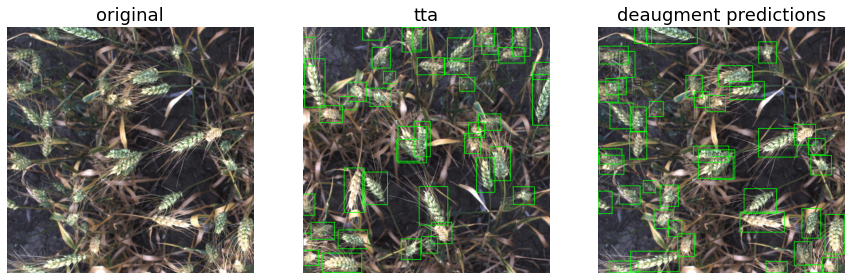

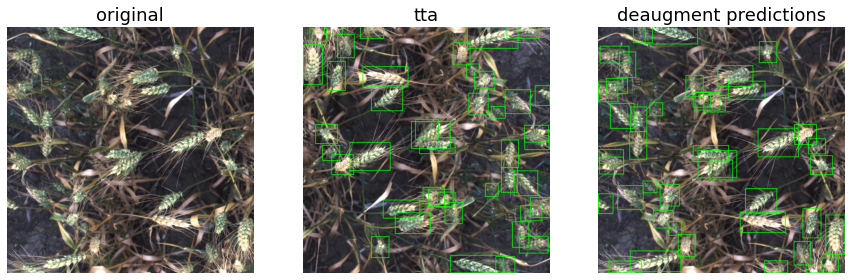

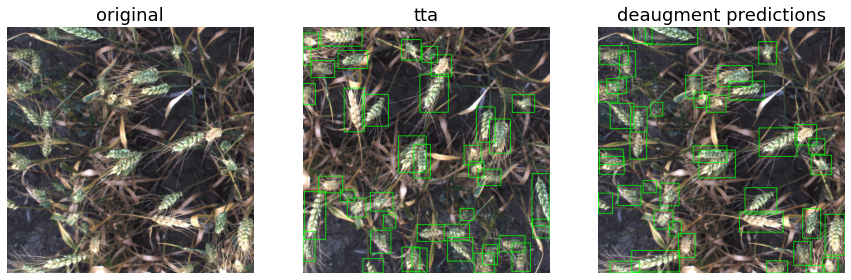

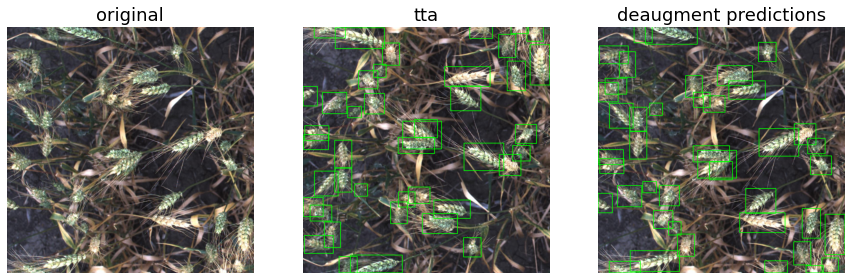

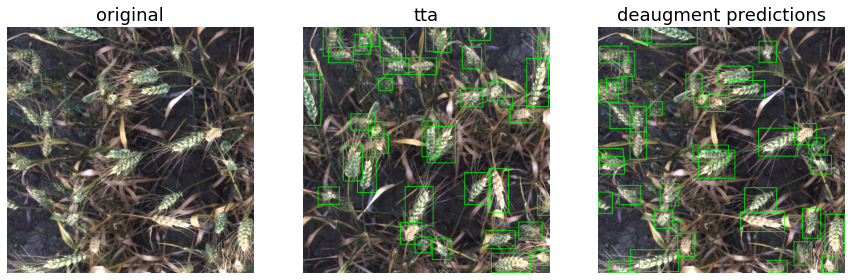

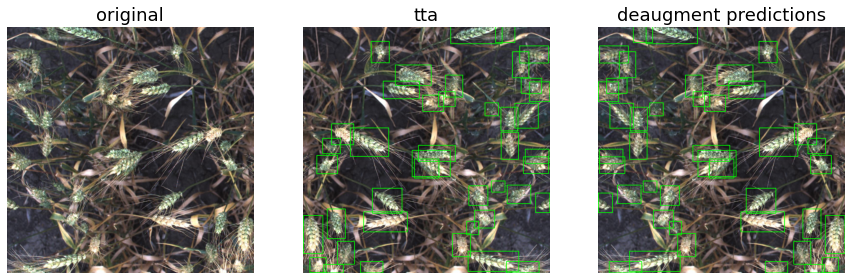

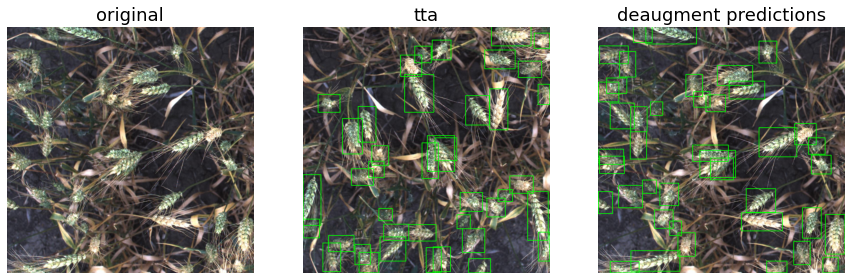

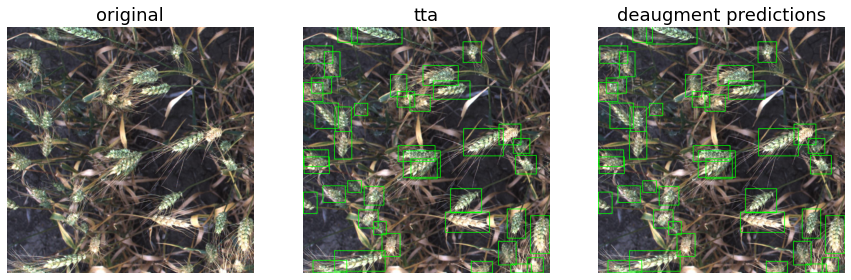

In [18]:
valid_data_loader = init_valid_dataloader()
images, _, image_ids = next(iter(valid_data_loader))
image_org, image_id = images[0], image_ids[0]
for transform in tta_transforms:
    image = image_org.clone()
    fig, ax = plt.subplots(1, 3, figsize=(15, 15))

    numpy_image = image.permute(1,2,0).cpu().numpy().copy()

    ax[0].imshow(numpy_image);
    ax[0].set_title('original', fontsize=18)
    ax[0].set_axis_off()

    tta_image = transform.augment(image)
    tta_image_numpy = tta_image.permute(1,2,0).cpu().numpy().copy()

    det = models['resnet50'][0](tta_image.unsqueeze(0).float().cuda())
    boxes, scores = process_det(0, det)
    boxes = (boxes).astype(np.int32).clip(min=0, max=1023)
    for box in boxes:
        cv2.rectangle(tta_image_numpy, (box[0], box[1]), (box[2],  box[3]), (0, 1, 0), 2)

    ax[1].imshow(tta_image_numpy);
    ax[1].set_title('tta', fontsize=18)
    ax[1].set_axis_off()
        
    boxes = transform.deaugment_boxes(boxes)
    boxes = (boxes).astype(np.int32).clip(min=0, max=1023)

    for box in boxes:
        cv2.rectangle(numpy_image, (box[0], box[1]), (box[2],  box[3]), (0, 1, 0), 2)
        
    ax[2].imshow(numpy_image);
    ax[2].set_title('deaugment predictions', fontsize=18)
    ax[2].set_axis_off();
    

# Weighted Boxes Fusion (WBF)

WBF Method, as explained in [Weighted Boxes Fusion: ensembling boxes for object detection models](https://arxiv.org/pdf/1910.13302.pdf), is a method originally introduced to merge predictions of ensemble models (so not single models). This is a common situation where WBF is applied:
![alt text](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F2231509%2Fda151c5553c2f903d653c43b7c1fb036%2Ftta_wbf_2.png?generation=1593364468512399&alt=media)

WBF method could be rephrased as a merging process of multiple predictions. These multiple predictions can come from different models or a single model using TTA.
Indeed, the whole of TTA (Test-Time Augmentation) is to make our single model make multiple predictions for a single having that have been augmented (usually simple rotations do the trick). All these predictions are then merged using WBF even if they come from a single model.
![alt text](https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F2231509%2F7091affff14f63d32ffdc58a1041af9b%2Ftta_wbf_1.png?generation=1593364448855769&alt=media)

We got the idea for using WBF insted of other approaches like NMS, after reading [WBF approach for ensemble](https://www.kaggle.com/shonenkov/wbf-approach-for-ensemble), again big appreciate!

a single object detection model always produces alot of boxes for each image. Similar to NMS (Non-maximum suppression), WBF is used to post-process multi-boxes prediction. 

Lets examen an the difference between these approaches. Considering a set of highly overlapped boxes, NMS simply choose the best (most confident) box, and eliminate the rest. In contrast, WBF will just 'average' all the boxes of this set.
![alt text](https://i.ibb.co/d2P2pPL/2020-05-12-21-02-34.png)


sources:
* https://github.com/ZFTurbo/Weighted-Boxes-Fusion

* [amazing discussion on wbf](https://www.kaggle.com/c/global-wheat-detection/discussion/162218)


In [19]:
def run_wbf(predictions, image_index, image_size=1024, iou_thr=0.55, skip_box_thr=0.7, weights=None,conf_type='avg', images=None):
    #prediction[image_index]['boxes']/(image_size) - scale the bounding box
    boxes = [prediction[image_index]['boxes']/(image_size) for prediction in predictions]
    scores = [prediction[image_index]['scores'] for prediction in predictions]
    labels = [np.ones(prediction[image_index]['scores'].shape[0]) for prediction in predictions]
    boxes, scores, labels = weighted_boxes_fusion(boxes, scores, 
                                                  labels, weights=None, 
                                                  iou_thr=iou_thr, 
                                                  skip_box_thr=skip_box_thr,
                                                  conf_type=conf_type)
    boxes = boxes*(image_size) #
    return boxes, scores, labels

# Intersection over Union (IoU)
Intersection over Union is a measure of the magnitude of overlap between two bounding boxes (or, in the more general case, two objects). It calculates the size of the overlap between two objects, divided by the total area of the two objects combined.

It can be visualized as the following:
![alt text](https://storage.googleapis.com/kaggle-media/competitions/rsna/IoU.jpg)

The two boxes in the visualization overlap, but the area of the overlap is insubstantial compared with the area taken up by both objects together. IoU would be low - and would likely not count as a "hit" at higher IoU thresholds.

to evaluate the score of our prediction we read [Competition metric details + script](https://www.kaggle.com/pestipeti/competition-metric-details-script)
and implement his scripts from there. 

# Mean Average Precision
This competition is evaluated on the mean average precision at different intersection over union (IoU) thresholds. The IoU of a set of predicted bounding boxes and ground truth bounding boxes is calculated as:
![alt text](https://tiefenauer.github.io/assets/img/articles/ml/dl_4/iou-formula.png)



The metric sweeps over a range of IoU thresholds, at each point calculating an average precision value. The threshold values range from 0.5 to 0.75 with a step size of 0.05. In other words, at a threshold of 0.5, a predicted object is considered a "hit" if its intersection over union with a ground truth object is greater than 0.5.

At each threshold value t, a precision value is calculated based on the number of true positives (TP), false negatives (FN), and false positives (FP) resulting from comparing the predicted object to all ground truth objects:


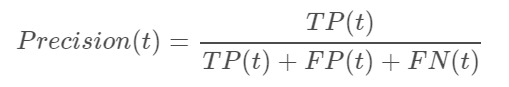

* A **true positive** is counted when a single predicted object matches a ground truth object with an IoU above the threshold.
* A **false positive** indicates a predicted object had no associated ground truth object.
* A **false negative** indicates a ground truth object had no associated predicted object.

* Important note: if there are no ground truth objects at all for a given image, ANY number of predictions (false positives) will result in the image receiving a score of zero, and being included in the mean average precision.

The average precision of a single image is calculated as the mean of the above precision values at each IoU threshold:

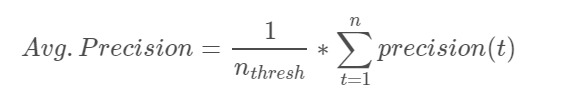


In your submission, you are also asked to provide a confidence level for each bounding box. Bounding boxes will be evaluated in order of their confidence levels in the above process. This means that bounding boxes with higher confidence will be checked first for matches against solutions, which determines what boxes are considered true and false positives.

Lastly, the score returned by the competition metric is the mean taken over the individual average precisions of each image in the test dataset.

In [20]:
import numba
from numba import jit
from typing import List, Union, Tuple
from numba.typed import List

@jit(nopython=True)
def calculate_iou(gt, pr, form='pascal_voc') -> float:
    """Calculates the Intersection over Union.

    Args:
        gt: (np.ndarray[Union[int, float]]) coordinates of the ground-truth box
        pr: (np.ndarray[Union[int, float]]) coordinates of the prdected box
        form: (str) gt/pred coordinates format
            - pascal_voc: [xmin, ymin, xmax, ymax]
            - coco: [xmin, ymin, w, h]
    Returns:
        (float) Intersection over union (0.0 <= iou <= 1.0)
    """
    if form == 'coco':
        gt = gt.copy()
        pr = pr.copy()

        gt[2] = gt[0] + gt[2]
        gt[3] = gt[1] + gt[3]
        pr[2] = pr[0] + pr[2]
        pr[3] = pr[1] + pr[3]

    # Calculate overlap area
    dx = min(gt[2], pr[2]) - max(gt[0], pr[0]) + 1
    
    if dx < 0:
        return 0.0
    
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1]) + 1

    if dy < 0:
        return 0.0

    overlap_area = dx * dy

    # Calculate union area
    union_area = (
            (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1) +
            (pr[2] - pr[0] + 1) * (pr[3] - pr[1] + 1) -
            overlap_area
    )

    return overlap_area / union_area

@jit(nopython=True)
def find_best_match(gts, pred, pred_idx, threshold = 0.5, form = 'pascal_voc', ious=None) -> int:
    """Returns the index of the 'best match' between the
    ground-truth boxes and the prediction. The 'best match'
    is the highest IoU. (0.0 IoUs are ignored).

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        pred: (List[Union[int, float]]) Coordinates of the predicted box
        pred_idx: (int) Index of the current predicted box
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (int) Index of the best match GT box (-1 if no match above threshold)
    """
    best_match_iou = -np.inf
    best_match_idx = -1

    for gt_idx in range(len(gts)):
        
        if gts[gt_idx][0] < 0:
            # Already matched GT-box
            continue
        
        iou = -1 if ious is None else ious[gt_idx][pred_idx]

        if iou < 0:
            iou = calculate_iou(gts[gt_idx], pred, form=form)
            
            if ious is not None:
                ious[gt_idx][pred_idx] = iou

        if iou < threshold:
            continue

        if iou > best_match_iou:
            best_match_iou = iou
            best_match_idx = gt_idx

    return best_match_idx

@jit(nopython=True)
def calculate_precision(gts, preds, threshold = 0.5, form = 'coco', ious=None) -> float:
    """Calculates precision for GT - prediction pairs at one threshold.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (float) Precision
    """
    n = len(preds)
    tp = 0
    fp = 0
    
    # for pred_idx, pred in enumerate(preds_sorted):
    for pred_idx in range(n):

        best_match_gt_idx = find_best_match(gts, preds[pred_idx], pred_idx,
                                            threshold=threshold, form=form, ious=ious)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1
            # Remove the matched GT box
            gts[best_match_gt_idx] = -1

        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = (gts.sum(axis=1) > 0).sum()

    return tp / (tp + fp + fn)

@jit(nopython=True)
def calculate_image_precision(gts, preds, thresholds = (0.5, ), form = 'coco') -> float:
    """Calculates image precision.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        thresholds: (float) Different thresholds
        form: (str) Format of the coordinates

    Return:
        (float) Precision
    """
    n_threshold = len(thresholds)
    image_precision = 0.0
    
    ious = np.ones((len(gts), len(preds))) * -1
    # ious = None

    for threshold in thresholds:
        precision_at_threshold = calculate_precision(gts.copy(), preds, threshold=threshold,
                                                     form=form, ious=ious)
        image_precision += precision_at_threshold / n_threshold

    return image_precision



# IoU calculation on validition dataset

In [21]:
def show_results(images):
    plt.figure(figsize=(100, 100))
    for i, image in enumerate(images):
        # plt.figure(figsize=(25, 25))
        plt.subplot(1, 4, i+1)
        plt.imshow(image)
        plt.axis('off')
    plt.show()

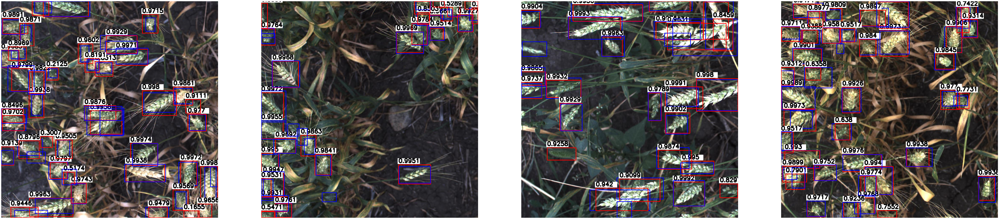

In [22]:
def show_model_results(model):
    valid_data_loader = init_valid_dataloader()
    display_batch=False
    results = []

    for j, (images, targets, _) in tqdm(enumerate(valid_data_loader), total=len(valid_data_loader), desc='Working:'):
        
        predictions = make_tta_predictions(model, images)
        for i in range(len(images)):

            boxes, scores, labels = run_wbf(predictions, image_index=i, iou_thr=0.42, skip_box_thr=0.35,conf_type='max')
            boxes = (boxes).astype(np.int32).clip(min=0, max=1023)

            gt_boxes = targets[i]['boxes'].detach().numpy()
            if j < 4:
                image = images[i].permute(1,2,0).cpu().numpy()
                image = normalize(image)
                for pred_bbox, gt_bbox, score in zip(boxes, gt_boxes, scores):
                                
                    pred_x1 = int(pred_bbox[0])
                    pred_y1 = int(pred_bbox[1])
                    pred_x2 = int(pred_bbox[2])
                    pred_y2 = int(pred_bbox[3])
                    
                    gt_x1 = int(gt_bbox[0])
                    gt_y1 = int(gt_bbox[1])
                    gt_x2 = int(gt_bbox[2])
                    gt_y2 = int(gt_bbox[3])
                    cv2.rectangle(image, (pred_x1, pred_y1), (pred_x2, pred_y2), color=(1, 0, 0), thickness=2)
                    cv2.rectangle(image, (gt_x1, gt_y1), (gt_x2, gt_y2), color=(0, 0, 1), thickness=2)
                    cv2.rectangle(image, (pred_x1-4, pred_y1-4), (pred_x1+100, pred_y1-30), (1,1,1), -1)
                    cv2.putText(image, str(round(score, 4)), 
                                (pred_x1, pred_y1-10), cv2.FONT_HERSHEY_SIMPLEX, 
                                0.9, color=(0, 0, 0), thickness=3)
                results.append(image)
                if j == 3:
                    display_batch=True
            if display_batch:
                display_batch=False
                show_results(results)
            
                    
show_model_results(models['resnet50'][0])

In [28]:
def IoU(models_list):
    iou_thresholds = List()
    [iou_thresholds.append(x) for x in np.arange(0.5, 0.76, 0.05)]
    validation_image_precisions = []
    display_batch=False

    THRESH = 0.35
    results = []
    valid_data_loader = init_valid_dataloader()

    for j, (images, targets, _) in tqdm(enumerate(valid_data_loader), total=len(valid_data_loader), desc='Working:'):
        
        models_predictions = []
        for modelss in models_list:
            predictions = make_ensemble_predictions(images, modelss) #[[{}], [{}], [{}]]
            
            boxes, scores, labels = run_wbf(predictions, image_index=0, 
                                            iou_thr=0.42, skip_box_thr=0.35,
                                            conf_type='max')
            dic={
                'boxes': boxes,
                'scores': scores
            }
            models_predictions.append([dic])

        for i in range(len(images)):

            boxes, scores, labels = run_wbf(models_predictions, image_index=i, iou_thr=0.42, skip_box_thr=0.35,conf_type='max')
            boxes = (boxes).astype(np.int32).clip(min=0, max=1023)

            gt_boxes = targets[i]['boxes'].detach().numpy()
            preds_sorted_idx = np.argsort(scores)[::-1]
            preds_sorted = boxes[preds_sorted_idx]

            image_precision = calculate_image_precision(preds_sorted,
                                                        gt_boxes,
                                                        thresholds=iou_thresholds,
                                                        form='pascal_voc')

            validation_image_precisions.append(image_precision)

    # tqdm.disable()      
    iou = np.mean(validation_image_precisions)           
    print(f"Validation IOU: {iou}")
    return iou

#  IoU for each fold, at this notebook we presenet only the folds of resnet50 

In [31]:
from pprint import pprint
results = {}
for i, fold in enumerate(models['resnet50']):
    # print(f'\nresnet50 fold {i+1}:')
    models_list = [[fold]]
    results[f'fold {i+1}'] = IoU(models_list)
pprint(results)




Validation IOU: 0.7190188685860852



Validation IOU: 0.7393376306550682



Validation IOU: 0.7396961219137907



Validation IOU: 0.7143263571988645



Validation IOU: 0.7456807662650539
{'fold 1': 0.7190188685860852,
 'fold 2': 0.7393376306550682,
 'fold 3': 0.7396961219137907,
 'fold 4': 0.7143263571988645,
 'fold 5': 0.7456807662650539}


#  IoU for k-fold of each backbone: resnet50/101/152

In [ ]:
from pprint import pprint
results1 = {}
for i, (model_name, models_list) in enumerate(models.items()):
    results1[f'{model_name}'] = IoU([models_list])
pprint(results1)



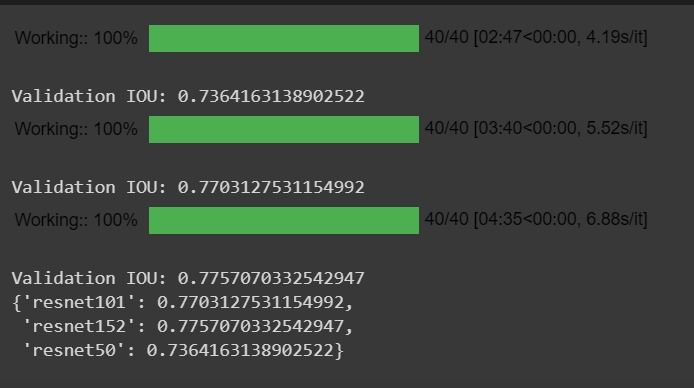


#  IoU for ensemble models

In [34]:
models_list=[models['resnet50'], models['resnet101'], models['resnet152']]
iou = IoU(models_list)
print(f'finall iou: {iou}')



Validation IOU: 0.7598767091519045
finall iou: 0.7598767091519045


In [35]:
class DatasetRetriever(Dataset):

    def __init__(self, image_ids, transforms=None):
        super().__init__()
        self.image_ids = image_ids
        self.transforms = transforms

    def __getitem__(self, index: int):
        image_id = self.image_ids[index]
        image = cv2.imread(f'{DATA_ROOT_PATH}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        if self.transforms:
            sample = {'image': image}
            sample = self.transforms(**sample)
            image = sample['image']
        return image, image_id

    def __len__(self) -> int:
        return self.image_ids.shape[0]

def get_test_transform():
    return Compose([ToTensorV2(p=1.0)])

def init_test_dataloader():
    dataset = DatasetRetriever(
        image_ids=np.array([path.split('/')[-1][:-4] for path in glob(f'{DATA_ROOT_PATH}/*.jpg')]),
        transforms=get_test_transform())
    
    data_loader = DataLoader(
        dataset,
        batch_size=1,
        shuffle=False,
        num_workers=4,
        drop_last=False,
        collate_fn=collate_fn)
    return data_loader




#  Test results!

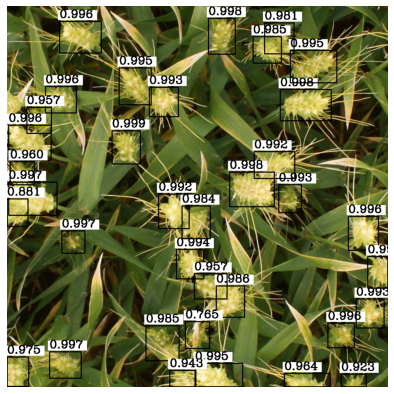

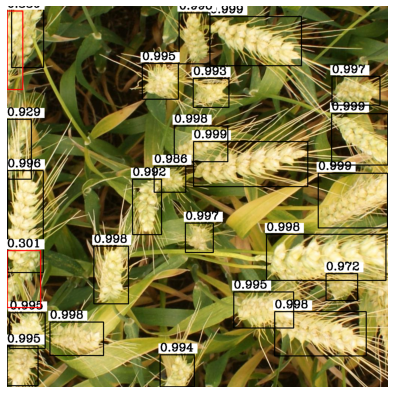

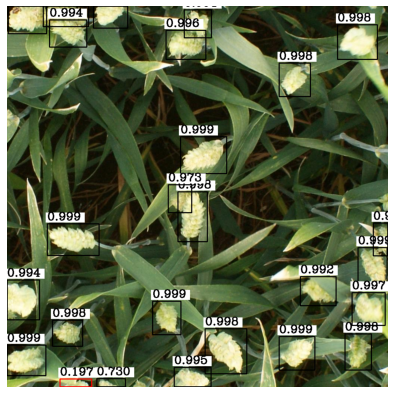

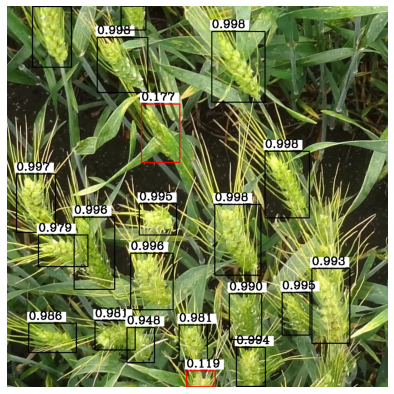

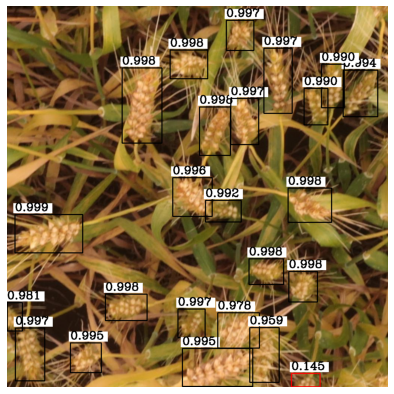

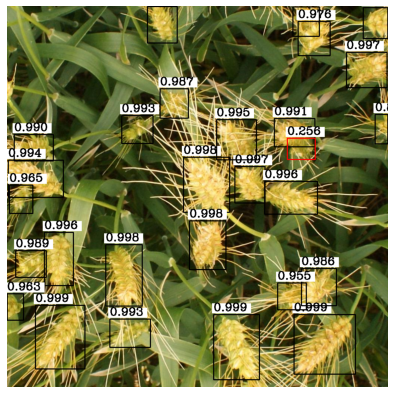

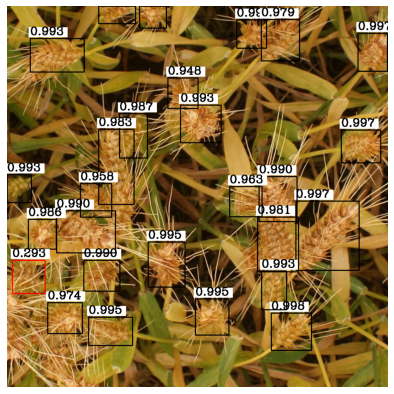

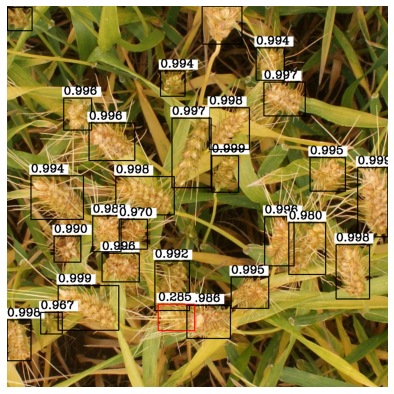

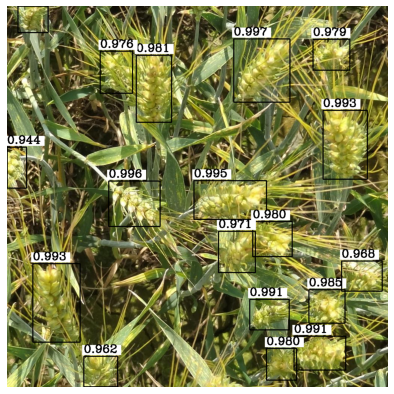

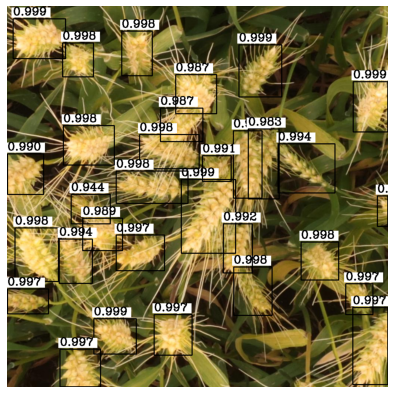

,image_id,PredictionString
0,348a992bb,0.9985 282 335 76 89 0.9981 541 33 72 96 0.998...
1,51b3e36ab,0.9994 545 28 246 132 0.9992 501 364 307 121 0...
2,2fd875eaa,0.9992 108 585 139 85 0.9991 466 351 124 99 0....
3,aac893a91,0.9985 558 533 124 190 0.9984 550 68 143 190 0...
4,cb8d261a3,0.9989 21 560 182 103 0.9985 309 166 107 202 0...


In [37]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))
    return " ".join(pred_strings)

def visualize_results(sample, boxes, scores, score_thresh=0.0,  show_error=False):
        # sample = cv2.resize(sample,(1024,1024))
        indexes = np.where(scores > score_thresh)[0]
        if not show_error:
            boxes = boxes[indexes]

        fig, ax = plt.subplots(1, 1, figsize=(7, 7))
        colors = [(0, 0, 0), (1, 0, 0)]
        for index, (box, score) in enumerate(zip(boxes,scores)):
            if index not in indexes:
                c = colors[1]
            else:
                c = colors[0]
            cv2.rectangle(sample, (box[0], box[1]), (box[2], box[3]),  c, 2)
            cv2.rectangle(sample, (box[0]-4, box[1]-4), (box[0]+100, box[1]-30), (1,1,1), -1)
            cv2.putText(sample, f'{score:.3f}', (box[0], box[1]-10),
                        cv2.FONT_HERSHEY_COMPLEX,  
                        1, (0, 0, 0), 2, cv2.LINE_AA) 
            
        ax.set_axis_off()
        ax.imshow(sample);
        plt.show()


def test(models_list, visualize=True):
    data_loader = init_test_dataloader()
    THRESH = 0.35
    results = []
    for j, (images, image_ids) in tqdm(enumerate(data_loader), total=len(data_loader), desc='Working:'):
        
        models_predictions = []
        for modelss in models_list:
            predictions = make_ensemble_predictions(images, modelss) #[[{}], [{}], [{}]]
            boxes, scores, labels = run_wbf(predictions, image_index=0, iou_thr=0.42, skip_box_thr=0.35,conf_type='max')
            dic={
                'boxes': boxes,
                'scores': scores
            }
            models_predictions.append([dic])
            

        for i in range(len(images)):

            boxes, scores, labels = run_wbf(models_predictions, image_index=i, iou_thr=0.42, skip_box_thr=0.35,conf_type='max')
            boxes = (boxes).astype(np.int32).clip(min=0, max=1023)
            if visualize:
                visualize_results(images[i].permute(1,2,0).cpu().numpy(), boxes, scores, THRESH, show_error=True)
            indexes = np.where(scores > THRESH)[0]
            boxes = boxes[indexes]

            boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
            boxes[:, 3] = boxes[:, 3] - boxes[:, 1]

            result = {
                'image_id': image_ids[i],
                'PredictionString': format_prediction_string(boxes, scores)
            }
            results.append(result)
        
        
    return results
    
models_list=[models['resnet50'], models['resnet101'], models['resnet152']]#, models]
results = test(models_list)
test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
test_df.to_csv('submission.csv', index=False)
test_df.head()


# submit result!

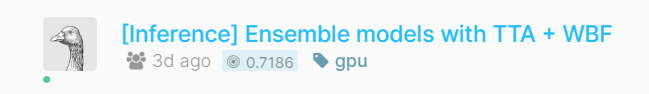
